In [1]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# import arrest.csv
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/Arrest_Data_from_2020_to_Present.csv')
df.head(2)

,Report ID,Report Type,Arrest Date,Time,Area ID,Area Name,Reporting District,Age,Sex Code,Descent Code,...,Disposition Description,Address,Cross Street,LAT,LON,Location,Booking Date,Booking Time,Booking Location,Booking Location Code
0,6636966,BOOKING,07/06/2023 12:00:00 AM,2250.0,8,West LA,817,46,M,B,...,MISDEMEANOR COMPLAINT FILED,900 GAYLEY AV,NaN,34.0637,-118.4482,POINT (-118.4482 34.0637),07/07/2023 12:00:00 AM,143.0,METRO - JAIL DIVISION,4273.0
1,6637119,BOOKING,07/07/2023 12:00:00 AM,1000.0,3,Southwest,396,39,M,B,...,MISDEMEANOR COMPLAINT FILED,40TH PL,VERMONT,34.0100,-118.2915,POINT (-118.2915 34.01),07/07/2023 12:00:00 AM,1156.0,77TH ST,4212.0


# Data Inspection

In [4]:
# dimensions of df
df.shape

(339324, 25)

In [5]:
# count of data types for the columns
df.dtypes.value_counts()

,count
object,15
float64,6
int64,4


In [6]:
# unique values under Report Type
df['Report Type'].unique()

array(['BOOKING', 'RFC'], dtype=object)

In [7]:
# list each column and the count of missing values
df.isna().sum()

,0
Report ID,0
Report Type,0
Arrest Date,0
Time,21
Area ID,0
Area Name,0
Reporting District,0
Age,0
Sex Code,0
Descent Code,0


# Data Cleaning

In [8]:
# drop columns Charge Group Code, Charge Group Description, Charge Description, Disposition Description, Cross Street, Booking Date, Booking Time, Booking Location	, Booking Location Code
df.drop(columns=['Charge Group Code',
                 'Charge Group Description',
                 'Charge Description',

                 'Cross Street',
                 'Booking Date',
                 'Booking Time',
                 'Booking Location',
                 'Booking Location Code',
                 'Location'
                 ],
        inplace=True)
df.head(2)

,Report ID,Report Type,Arrest Date,Time,Area ID,Area Name,Reporting District,Age,Sex Code,Descent Code,Arrest Type Code,Charge,Disposition Description,Address,LAT,LON
0,6636966,BOOKING,07/06/2023 12:00:00 AM,2250.0,8,West LA,817,46,M,B,F,245(A)(1)PC,MISDEMEANOR COMPLAINT FILED,900 GAYLEY AV,34.0637,-118.4482
1,6637119,BOOKING,07/07/2023 12:00:00 AM,1000.0,3,Southwest,396,39,M,B,M,243.4(D)PC,MISDEMEANOR COMPLAINT FILED,40TH PL,34.0100,-118.2915


In [9]:
# create new column called "Age Range" that puts the entries under Age into buckets in intervals of 10
df['Age Range'] = pd.cut(df['Age'], bins=range(0, 101, 10))
# remove the brackets and comma for Age Range and just have a dash between the numbers
df['Age Range'] = df['Age Range'].astype(str).str.replace('(', '').str.replace(']', '').str.replace(', ', '-')
df.head(2)

,Report ID,Report Type,Arrest Date,Time,Area ID,Area Name,Reporting District,Age,Sex Code,Descent Code,Arrest Type Code,Charge,Disposition Description,Address,LAT,LON,Age Range
0,6636966,BOOKING,07/06/2023 12:00:00 AM,2250.0,8,West LA,817,46,M,B,F,245(A)(1)PC,MISDEMEANOR COMPLAINT FILED,900 GAYLEY AV,34.0637,-118.4482,40-50
1,6637119,BOOKING,07/07/2023 12:00:00 AM,1000.0,3,Southwest,396,39,M,B,M,243.4(D)PC,MISDEMEANOR COMPLAINT FILED,40TH PL,34.0100,-118.2915,30-40


# Seaborn Visualizations (paste charts onto report too)

In [10]:
import seaborn as sns

<Axes: xlabel='Age Range', ylabel='count'>

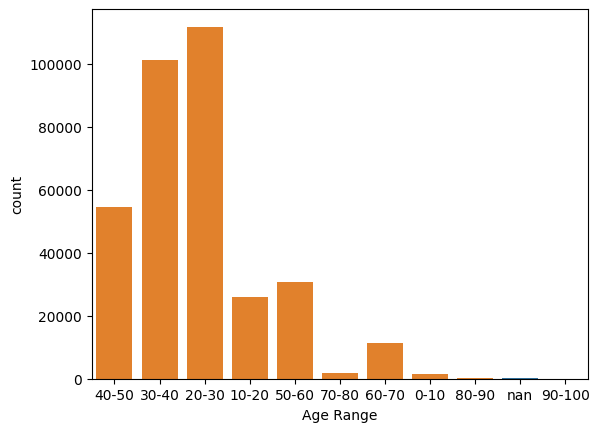

In [11]:
# seaborn bar chart for count of Age Range
sns.countplot(x='Age Range', data=df)
# Define the desired order of age ranges
age_range_order = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100']

# Create the countplot with the hardcoded order
sns.countplot(x='Age Range', data=df, order=age_range_order)

In [12]:
# import plotly
import plotly.express as px

In [13]:
try:
  fig = px.scatter_mapbox(df,
                          lat="LAT",
                          lon="LON",
                          zoom=10,
                          height=600,
                          width=800,
                          title="Arrest Locations in LA",
                          hover_name="Age Range") # example hover data - replace with relevant column
  fig.update_layout(mapbox_style="carto-positron")
  fig.show()
except KeyError as e:
  print(f"Error: Could not create choropleth map due to a KeyError: {e}")
  print("Please make sure your data frame has a 'Latitude' and 'Longitude' column.")
except Exception as e:
  print(f"An unexpected error occurred: {e}")


<ipython-input-14-cba3a2045854>:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



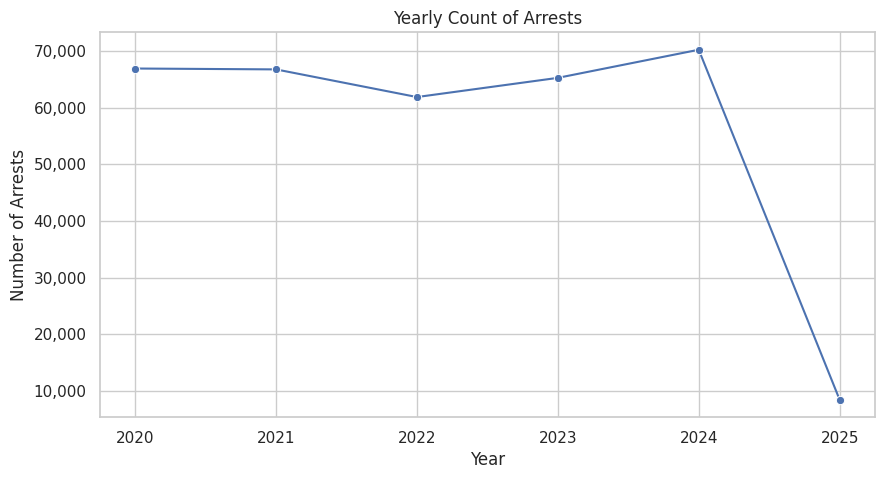

In [14]:
import matplotlib.pyplot as plt

# Convert 'Arrest Date' to datetime format and extract the year
df['Arrest Date'] = pd.to_datetime(df['Arrest Date'], errors='coerce')
df['Arrest Year'] = df['Arrest Date'].dt.year

# Aggregate yearly counts
yearly_counts = df['Arrest Year'].value_counts().sort_index()

# Set Seaborn style
sns.set_theme(style="whitegrid")

# Create line plot using Seaborn
plt.figure(figsize=(10, 5))
ax = sns.lineplot(x=yearly_counts.index, y=yearly_counts.values, marker='o', linestyle='-', color='b')

# Format y-axis with commas
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# Labels and title
plt.xlabel("Year")
plt.ylabel("Number of Arrests")
plt.title("Yearly Count of Arrests")

plt.show()

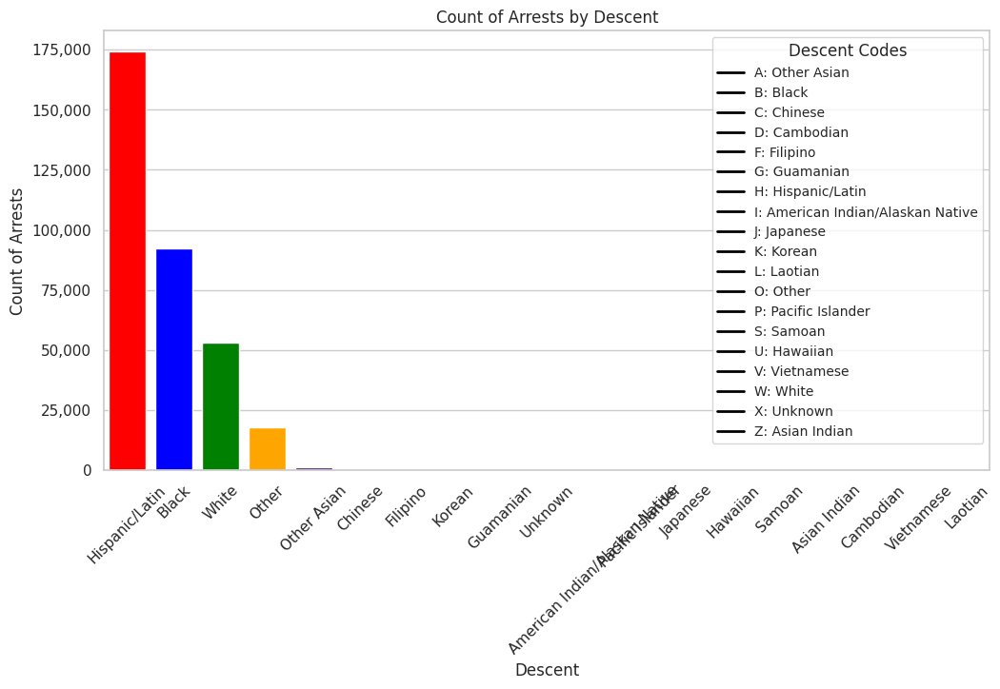

In [15]:
# Mapping of descent codes to their meanings
descent_mapping = {
    'A': 'Other Asian', 'B': 'Black', 'C': 'Chinese', 'D': 'Cambodian', 'F': 'Filipino', 'G': 'Guamanian',
    'H': 'Hispanic/Latin', 'I': 'American Indian/Alaskan Native', 'J': 'Japanese', 'K': 'Korean', 'L': 'Laotian',
    'O': 'Other', 'P': 'Pacific Islander', 'S': 'Samoan', 'U': 'Hawaiian', 'V': 'Vietnamese', 'W': 'White',
    'X': 'Unknown', 'Z': 'Asian Indian'
}

# Create new "Descent" column
df['Descent'] = df['Descent Code'].map(descent_mapping)

# Count occurrences of each descent category
descent_counts = df['Descent'].value_counts().reset_index()
descent_counts.columns = ['Descent', 'Count']

# Set Seaborn style
sns.set_theme(style="whitegrid")

# Define custom colors: first four bars are distinct, others use 'viridis' palette
custom_colors = ['red', 'blue', 'green', 'orange'] + sns.color_palette("viridis", len(descent_counts) - 4)

# Create the bar chart with manually assigned colors
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=descent_counts, x='Descent', y='Count', color='gray')  # Using a default color to avoid palette

# Manually assign colors to bars
for i, bar in enumerate(ax.patches):
    bar.set_facecolor(custom_colors[i])

# Format y-axis with commas
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# Labels and title
plt.xlabel("Descent")
plt.ylabel("Count of Arrests")
plt.title("Count of Arrests by Descent")
plt.xticks(rotation=45)

# Add legend with descent code meanings
legend_labels = [f"{code}: {meaning}" for code, meaning in descent_mapping.items() if code in df['Descent Code'].unique()]
handles = [plt.Line2D([0], [0], color="black", lw=2)] * len(legend_labels)
plt.legend(handles, legend_labels, title="Descent Codes", loc="upper right", fontsize=10, frameon=True)

plt.show()

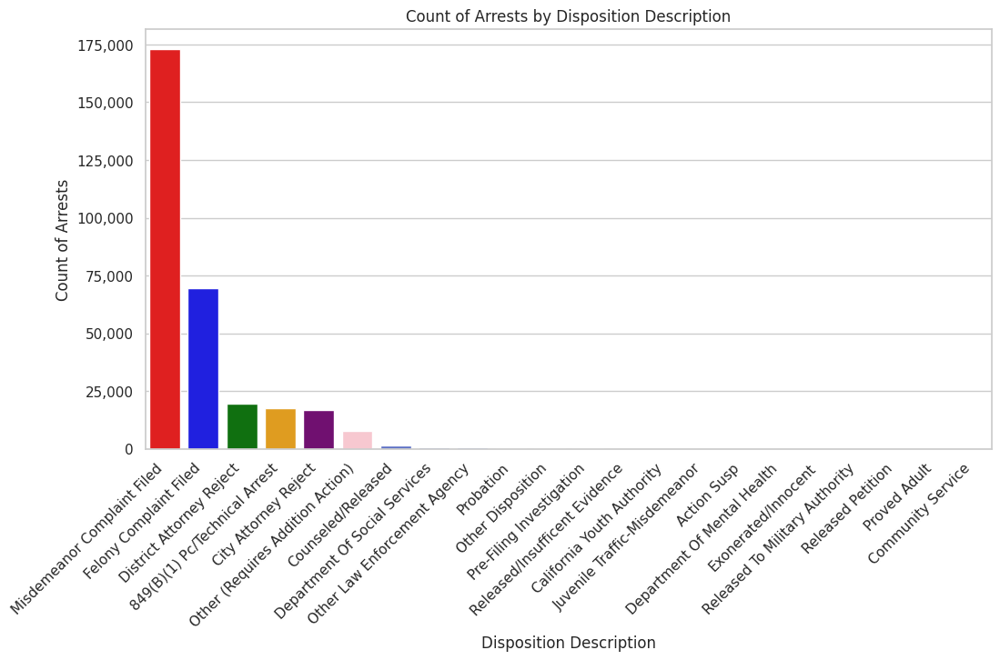

In [16]:
# Format "Disposition Description" - capitalize first letter of each word
df['Disposition Description'] = df['Disposition Description'].str.title()

# Count occurrences of each disposition description
disposition_counts = df['Disposition Description'].value_counts().reset_index()
disposition_counts.columns = ['Disposition Description', 'Count']

# Set Seaborn style
sns.set_theme(style="whitegrid")

# Define custom colors: first six bars are distinct, others use 'coolwarm' palette
custom_colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink'] + sns.color_palette("coolwarm", len(disposition_counts) - 6)

# Create bar chart using `hue` to apply custom colors
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=disposition_counts,
    x='Disposition Description',
    y='Count',
    hue='Disposition Description',  # Assign hue to fix the warning
    palette=custom_colors,
    legend=False  # Hide legend since hue is only for colors
)

# Format y-axis with commas
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# Labels and title
plt.xlabel("Disposition Description")
plt.ylabel("Count of Arrests")
plt.title("Count of Arrests by Disposition Description")
plt.xticks(rotation=45, ha='right')

plt.show()

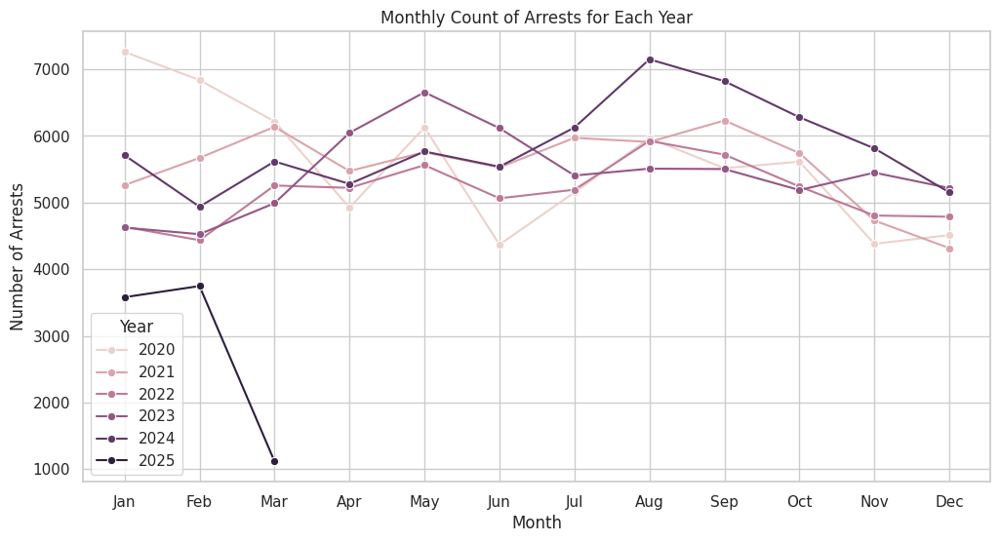

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'Arrest Date' to datetime format
df['Arrest Date'] = pd.to_datetime(df['Arrest Date'])

df['Year'] = df['Arrest Date'].dt.year
df['Month'] = df['Arrest Date'].dt.month

# Aggregate arrest counts per month for each year
monthly_counts = df.groupby(['Year', 'Month']).size().reset_index(name='Arrest Count')

plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_counts, x='Month', y='Arrest Count', hue='Year', marker='o')

plt.xlabel("Month")
plt.ylabel("Number of Arrests")
plt.title("Monthly Count of Arrests for Each Year")
plt.xticks(ticks=range(1, 13), labels=[
    "Jan", "Feb", "Mar", "Apr", "May", "Jun",
    "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"
])
plt.legend(title="Year")
plt.grid(True)
plt.show()

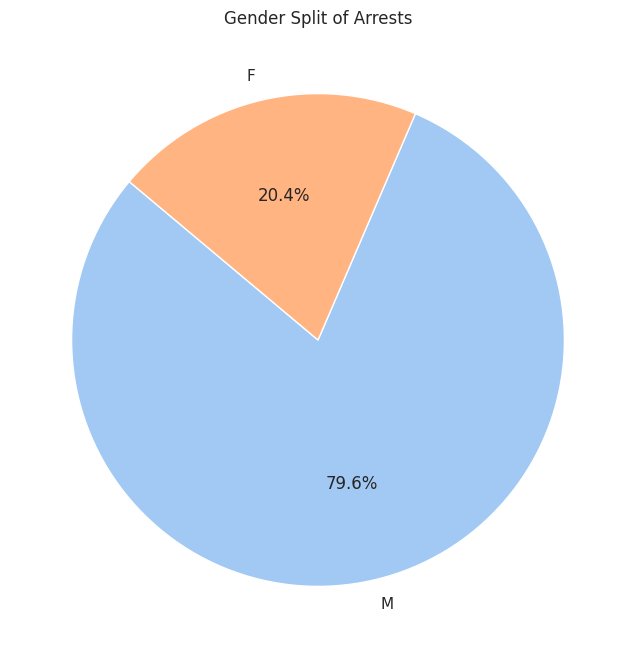

In [18]:
gender_counts = df['Sex Code'].value_counts()

plt.figure(figsize=(8, 8))
colors = sns.color_palette("pastel")  # Use a pastel color theme
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors=colors, startangle=140)

plt.title("Gender Split of Arrests")
plt.show()

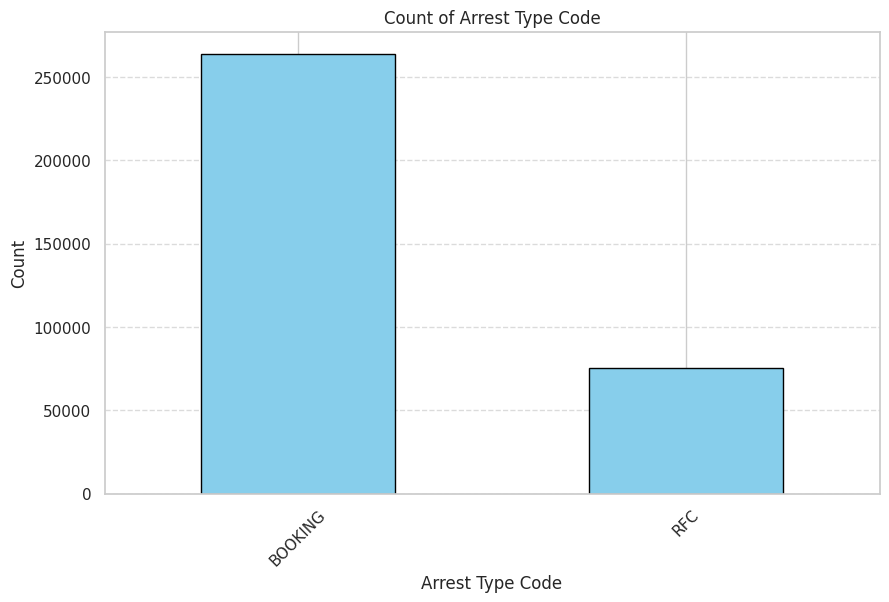

In [19]:
arrest_type_counts = df["Report Type"].value_counts()

plt.figure(figsize=(10, 6))
arrest_type_counts.plot(kind="bar", color="skyblue", edgecolor="black")

plt.xlabel("Arrest Type Code")
plt.ylabel("Count")
plt.title("Count of Arrest Type Code")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

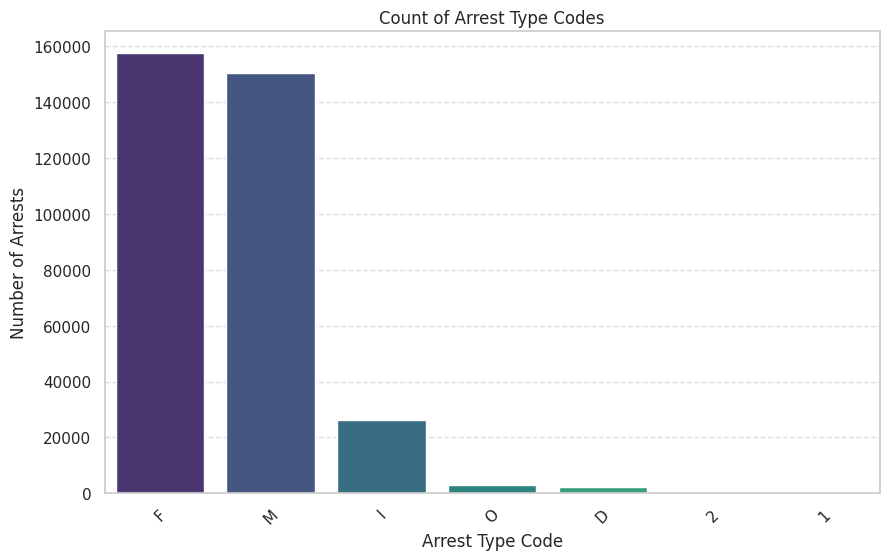

In [20]:
arrest_type_counts = df['Arrest Type Code'].value_counts().reset_index()
arrest_type_counts.columns = ['Arrest Type Code', 'Count']

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=arrest_type_counts,
    x='Arrest Type Code',
    y='Count',
    hue='Arrest Type Code',  # Assign hue
    palette="viridis",
    legend=False  # Disable legend
)
plt.xlabel("Arrest Type Code")
plt.ylabel("Number of Arrests")
plt.title("Count of Arrest Type Codes")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

In [21]:
#Advanced Analysis

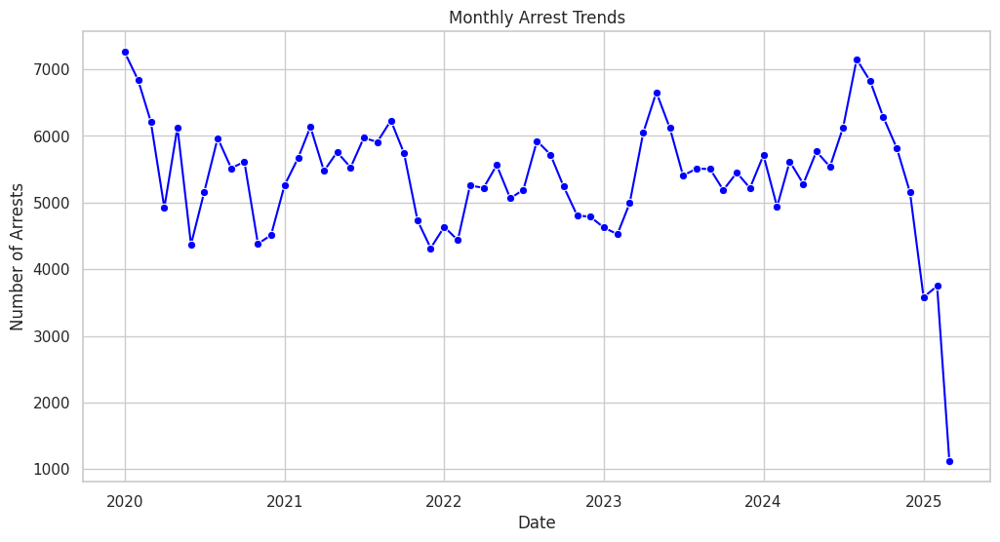

In [22]:
import seaborn as sns
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.arima.model import ARIMA

df["Arrest Date"] = pd.to_datetime(df["Arrest Date"], errors="coerce")

df["Year-Month"] = df["Arrest Date"].dt.to_period("M")

time_series = df.groupby("Year-Month").size()

# Convert to a proper time series format
time_series.index = time_series.index.to_timestamp()

plt.figure(figsize=(12, 6))
sns.lineplot(x=time_series.index, y=time_series.values, marker="o", color="blue")
plt.xlabel("Date")
plt.ylabel("Number of Arrests")
plt.title("Monthly Arrest Trends")
plt.grid(True)
plt.show()

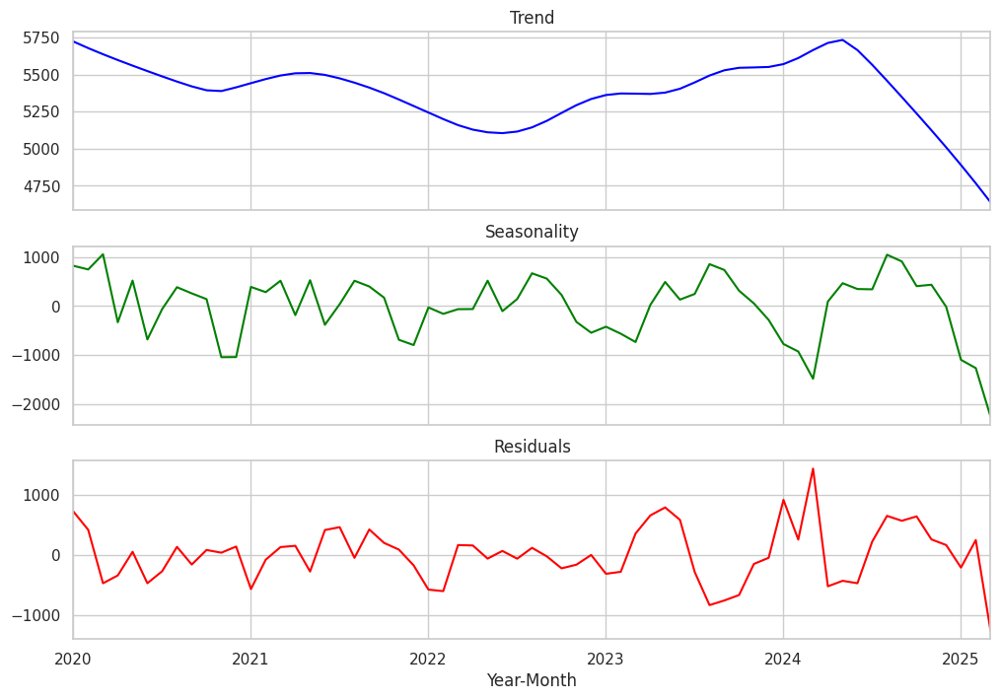

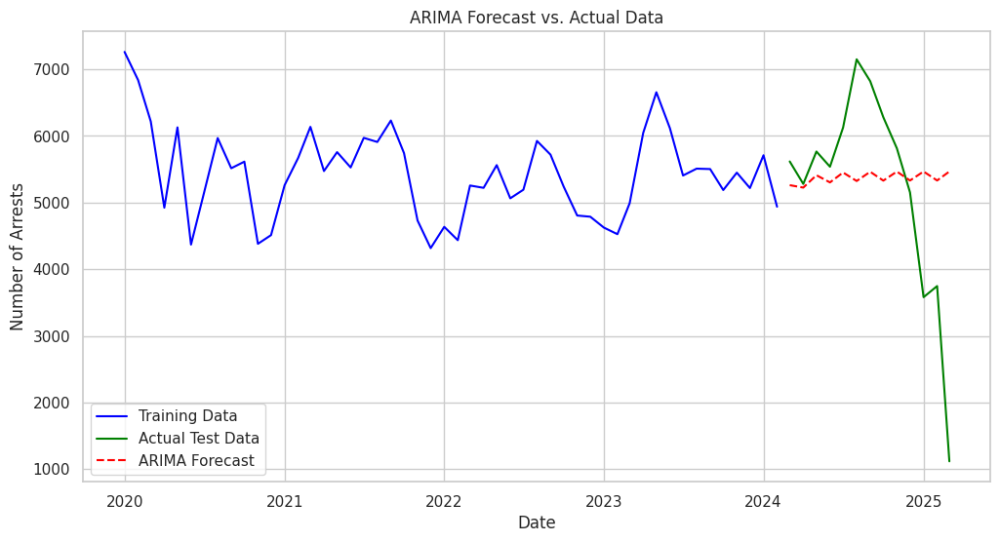

In [23]:
stl = STL(time_series, seasonal=13)
result = stl.fit()

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
result.trend.plot(ax=axes[0], title="Trend", color="blue")
result.seasonal.plot(ax=axes[1], title="Seasonality", color="green")
result.resid.plot(ax=axes[2], title="Residuals", color="red")
plt.show()

# ARIMA Model for Forecasting
train_size = int(len(time_series) * 0.8)  # Use 80% for training
train, test = time_series[:train_size], time_series[train_size:]

# Fit ARIMA Model (AutoRegressive Integrated Moving Average)
model = ARIMA(train, order=(2, 1, 2))  # Order (p, d, q) can be tuned
model_fit = model.fit()

# Forecast for the test period
forecast = model_fit.forecast(steps=len(test))

plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label="Training Data", color="blue")
plt.plot(test.index, test, label="Actual Test Data", color="green")
plt.plot(test.index, forecast, label="ARIMA Forecast", color="red", linestyle="dashed")
plt.xlabel("Date")
plt.ylabel("Number of Arrests")
plt.title("ARIMA Forecast vs. Actual Data")
plt.legend()
plt.grid(True)
plt.show()